In [26]:
import os

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
%matplotlib inline

In [27]:
df = pd.read_csv('./CMaps/train_FD001.txt', delim_whitespace=True, header=None)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [28]:
dependent_var = ['RUL']
index_columns_names = ['UnitNumber', 'Cycle']
operational_col_names = ["Optset" + str(i) for i in range(1, 4)]
sensor_col_names = ["Sensor" + str(i) for i in range(1, 22)]
input_file = index_columns_names + operational_col_names + sensor_col_names

In [29]:
url = './CMaps/train_FD001.txt'
df_train = pd.read_csv(url, delim_whitespace=True, names=input_file)
df_train.head()

,UnitNumber,Cycle,Optset1,Optset2,Optset3,Sensor1,Sensor2,Sensor3,Sensor4,Sensor5,...,Sensor12,Sensor13,Sensor14,Sensor15,Sensor16,Sensor17,Sensor18,Sensor19,Sensor20,Sensor21
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [30]:
rul = pd.DataFrame(df_train.groupby("UnitNumber")['Cycle'].max()).reset_index()
rul.columns = ['UnitNumber', 'max']
rul.head()

,UnitNumber,max
0,1,192
1,2,287
2,3,179
3,4,189
4,5,269


In [31]:
df_train = df_train.merge(rul, on=['UnitNumber'], how='left')
df_train['RUL'] = df_train['max'] - df_train['Cycle']
df_train.drop('max', axis=1, inplace=True)

df_train.head()

,UnitNumber,Cycle,Optset1,Optset2,Optset3,Sensor1,Sensor2,Sensor3,Sensor4,Sensor5,...,Sensor13,Sensor14,Sensor15,Sensor16,Sensor17,Sensor18,Sensor19,Sensor20,Sensor21,RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,191
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,190
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,189
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,187


In [32]:
# Import test dataset
df_test = pd.read_csv('./CMaps/test_FD001.txt', delim_whitespace=True, names=input_file)
df_test.head()

,UnitNumber,Cycle,Optset1,Optset2,Optset3,Sensor1,Sensor2,Sensor3,Sensor4,Sensor5,...,Sensor12,Sensor13,Sensor14,Sensor15,Sensor16,Sensor17,Sensor18,Sensor19,Sensor20,Sensor21
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,...,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,...,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,...,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,...,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,...,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130


In [33]:
# True RUL of engines of test data
y_true = pd.read_csv('./CMaps/RUL_FD001.txt', delim_whitespace=True, names=['RUL'])
y_true['UnitNumber'] = y_true.index
y_true.head()

,RUL,UnitNumber
0,112,0
1,98,1
2,69,2
3,82,3
4,91,4


In [34]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 27 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   UnitNumber  20631 non-null  int64  
 1   Cycle       20631 non-null  int64  
 2   Optset1     20631 non-null  float64
 3   Optset2     20631 non-null  float64
 4   Optset3     20631 non-null  float64
 5   Sensor1     20631 non-null  float64
 6   Sensor2     20631 non-null  float64
 7   Sensor3     20631 non-null  float64
 8   Sensor4     20631 non-null  float64
 9   Sensor5     20631 non-null  float64
 10  Sensor6     20631 non-null  float64
 11  Sensor7     20631 non-null  float64
 12  Sensor8     20631 non-null  float64
 13  Sensor9     20631 non-null  float64
 14  Sensor10    20631 non-null  float64
 15  Sensor11    20631 non-null  float64
 16  Sensor12    20631 non-null  float64
 17  Sensor13    20631 non-null  float64
 18  Sensor14    20631 non-null  float64
 19  Sensor15    20631 non-nul

In [35]:
df_train.shape

(20631, 27)

In [36]:
df_train.UnitNumber.unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

Text(0.5, 1.0, 'Life of Engines')

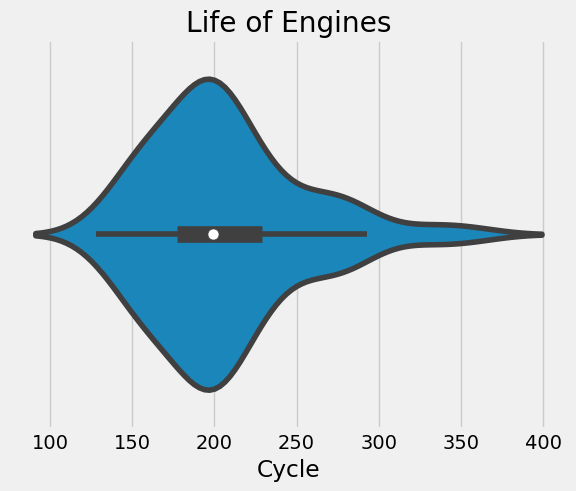

In [37]:
temp_df = df_train[["UnitNumber","Cycle"]].groupby("UnitNumber").max().reset_index()
sns.violinplot(x= temp_df['Cycle'])
plt.title("Life of Engines")

Average life of enginer is 200 cycles but few engines live upto 360 Cycles.

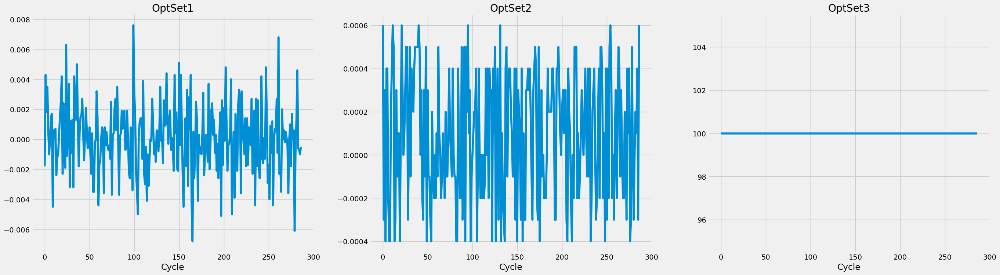

In [38]:
fig, ax = plt.subplots(1, 3, figsize=(30, 8), sharex='all')
for i in range(3): 
    df_u1 = df_train.query("UnitNumber==2").reset_index(drop=True)
    df_u1['Optset'+str(i+1)].plot(kind='line', ax=ax[i])
    ax[i].set_title('OptSet'+str(i+1))
    ax[i].set_xlabel("Cycle")

we can see that each engine operates under slightly different conditions under three dimensions which change over time (e.g. altitude or external air pressure). The figure above shows the values of these operational conditions over time for the same example engine in raw plot but averaging the values would give a better understanding of the operating condition. 

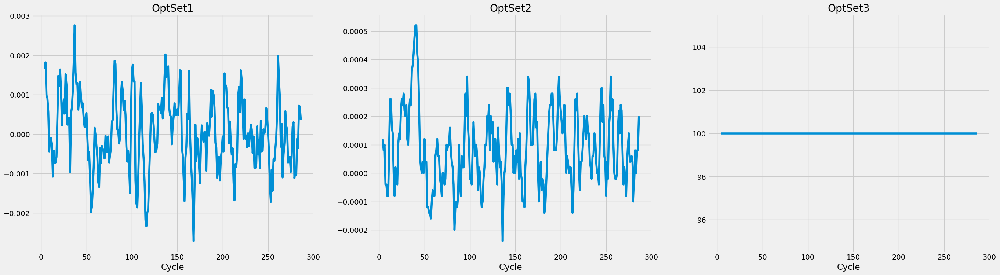

In [39]:
fig, ax = plt.subplots(1, 3, figsize=(30, 8), sharex='all')
for i in range(3):    
    df_u1 = df_train.query("UnitNumber==2").reset_index(drop=True)
    df_u1['rolling_avg'] = df_u1['Optset'+str(i+1)].rolling(window=5).mean()
    df_u1['rolling_avg'].plot(kind='line', ax=ax[i])
    ax[i].set_title('OptSet'+str(i+1))
    ax[i].set_xlabel("Cycle")

In [40]:
df_train

,UnitNumber,Cycle,Optset1,Optset2,Optset3,Sensor1,Sensor2,Sensor3,Sensor4,Sensor5,...,Sensor13,Sensor14,Sensor15,Sensor16,Sensor17,Sensor18,Sensor19,Sensor20,Sensor21,RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,191
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,190
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,189
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735,4
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594,3
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333,2
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640,1


### Plot of Operational Setting 1: OptSet1

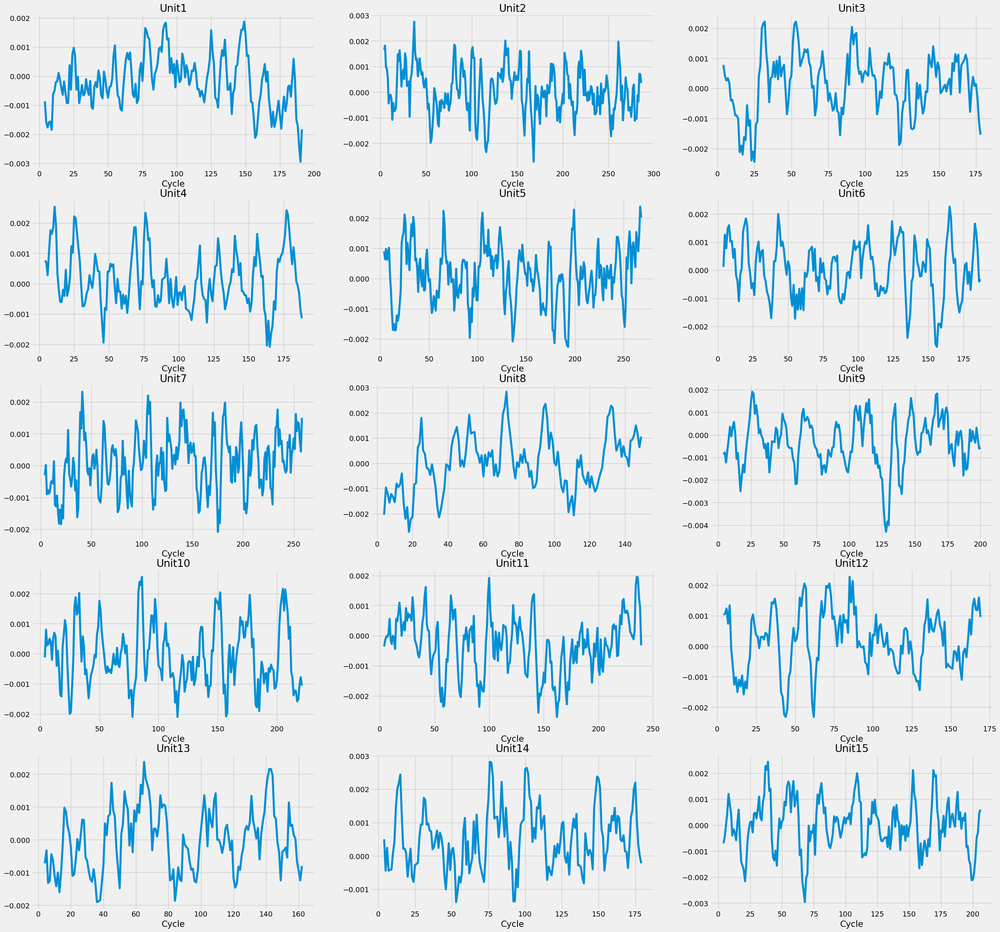

In [41]:
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(30, 30))
ax = axes.ravel()
for i in range(0, 15):
    df = df_train.Optset1[df_train.UnitNumber == i+1].reset_index(drop=True).rolling(window=5).mean()
    df.plot(kind='line', ax=ax[i])
    ax[i].set_title("Unit"+str(i+1))
    ax[i].set_xlabel("Cycle")

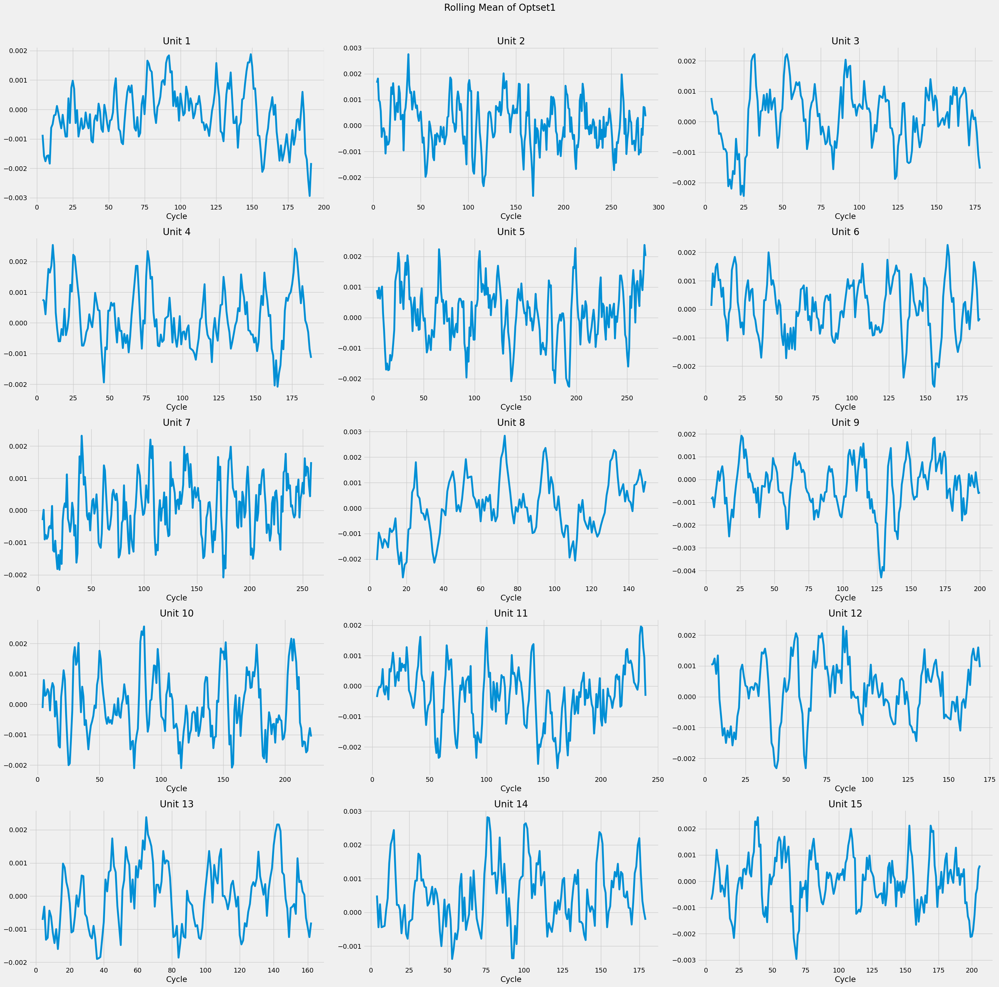

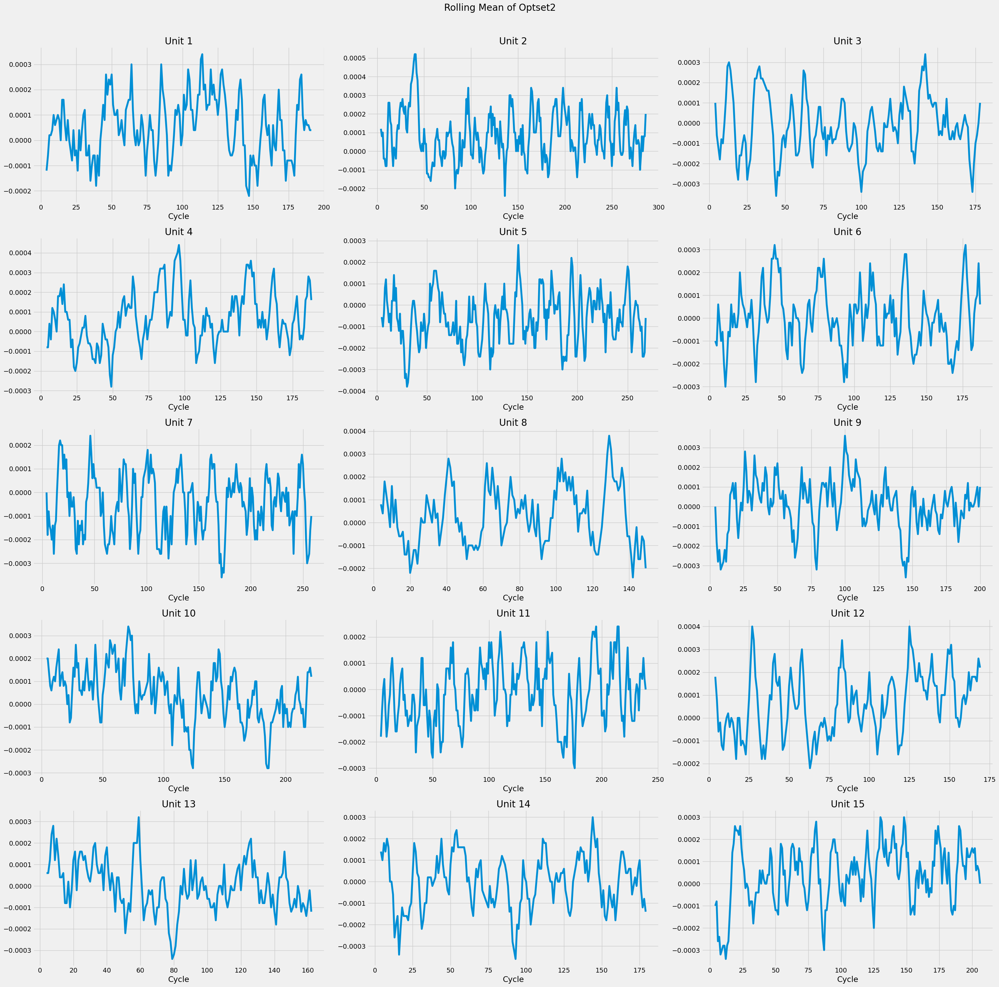

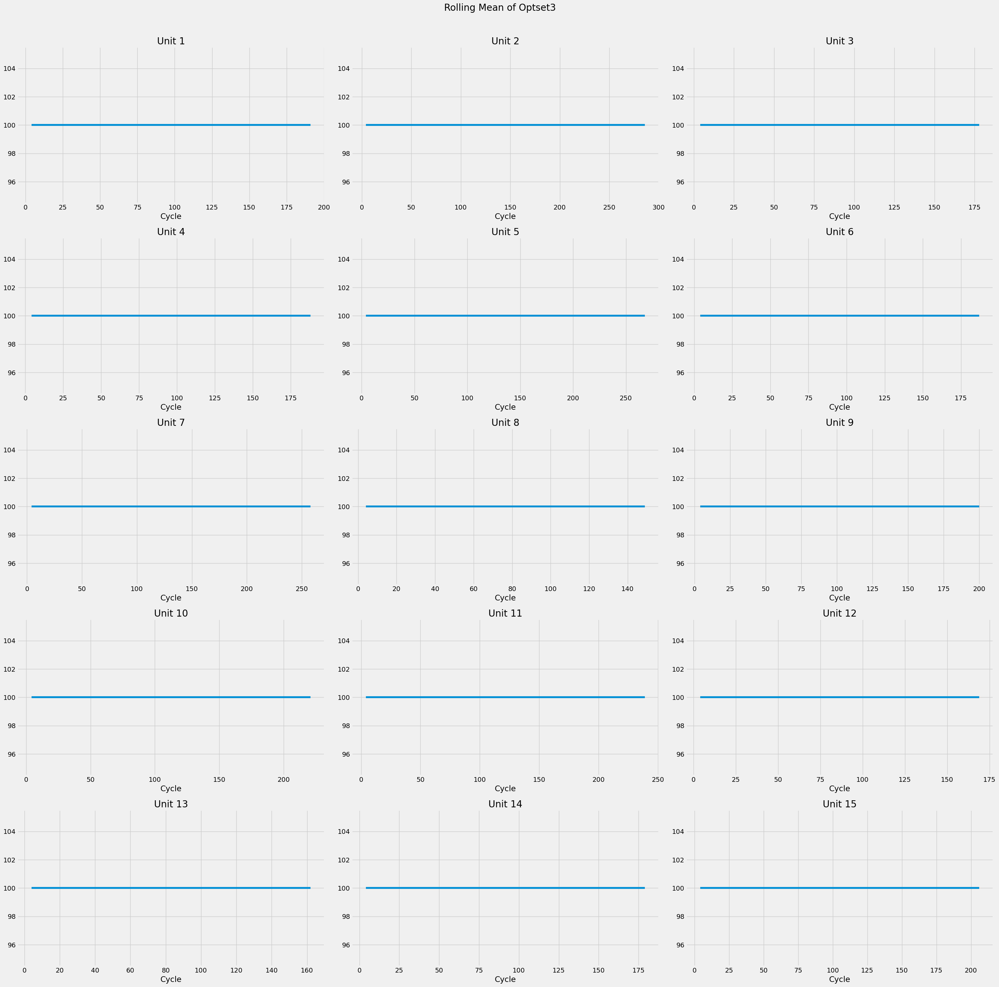

In [42]:
import matplotlib.pyplot as plt

def plot_rolling_mean(df, optset_col, unit_range, window=5, nrows=5, ncols=3, figsize=(30, 30), main_title="Rolling Mean Plot"):
    """
    Plots the rolling mean for a specified Optset column and unit range.

    Parameters:
    - df: DataFrame containing the data.
    - optset_col: String, the column name for Optset.
    - unit_range: List of unit numbers to plot.
    - window: Int, the window size for rolling mean.
    - nrows: Int, number of rows in the subplot grid.
    - ncols: Int, number of columns in the subplot grid.
    - figsize: Tuple, size of the entire figure.
    - main_title: String, the main title for the entire figure.
    """
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    fig.suptitle(main_title, fontsize=20)
    ax = axes.ravel()
    
    for i, unit in enumerate(unit_range):
        if i < len(ax):
            df_unit = df[df.UnitNumber == unit][optset_col].reset_index(drop=True).rolling(window=window).mean()
            df_unit.plot(kind='line', ax=ax[i])
            ax[i].set_title(f"Unit {unit}")
            ax[i].set_xlabel("Cycle")
    
    # Hide any unused subplots
    for j in range(len(unit_range), len(ax)):
        fig.delaxes(ax[j])
    
    plt.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to make room for the main title
    plt.show()

# Example usage:
plot_rolling_mean(df_train, 'Optset1', unit_range=range(1, 16), main_title="Rolling Mean of Optset1")
plot_rolling_mean(df_train, 'Optset2', unit_range=range(1, 16), main_title="Rolling Mean of Optset2")
plot_rolling_mean(df_train, 'Optset3', unit_range=range(1, 16), main_title="Rolling Mean of Optset3")


### Plot of Sensor Measurement

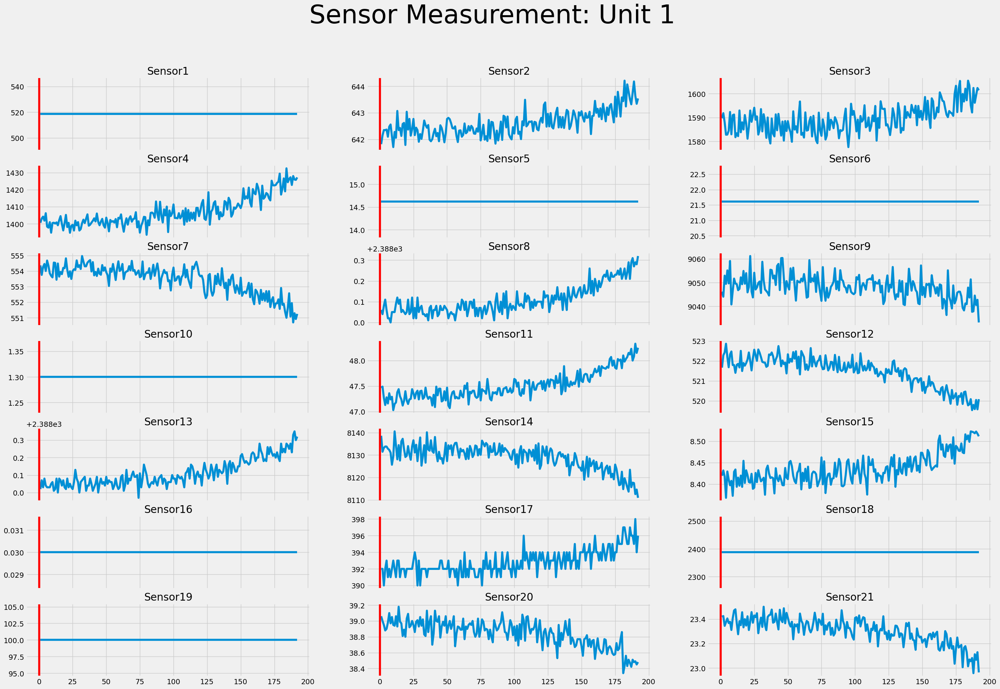

In [43]:
import matplotlib.pyplot as plt

def plot_sensor_traces(df, unit_number, sensor_count=21, nrows=7, ncols=3, figsize=(30, 20), main_title="Sensor Measurement"):
    
    fig, ax = plt.subplots(nrows, ncols, figsize=figsize, sharex=True)
    df_unit = df.query('UnitNumber == @unit_number')
    c = 0
    
    for i in range(nrows):
        for j in range(ncols):
            if c < sensor_count:
                ax[i, j].plot(df_unit.Cycle.values, df_unit[f'Sensor{c+1}'])
                ax[i, j].set_title(f'Sensor{c+1}')
                ax[i, j].axvline(0, color='r')
                c += 1
            else:
                fig.delaxes(ax[i, j])
    
    fig.suptitle(f'{main_title}: Unit {unit_number}', fontsize=50)
    plt.show()

# Example usage:
plot_sensor_traces(df_train, unit_number=1, sensor_count=21, main_title="Sensor Measurement")

### Correlation Analysis

Sensor Measure 6 remains almost constant as well with some minor fluctuations and we can remove it as well.


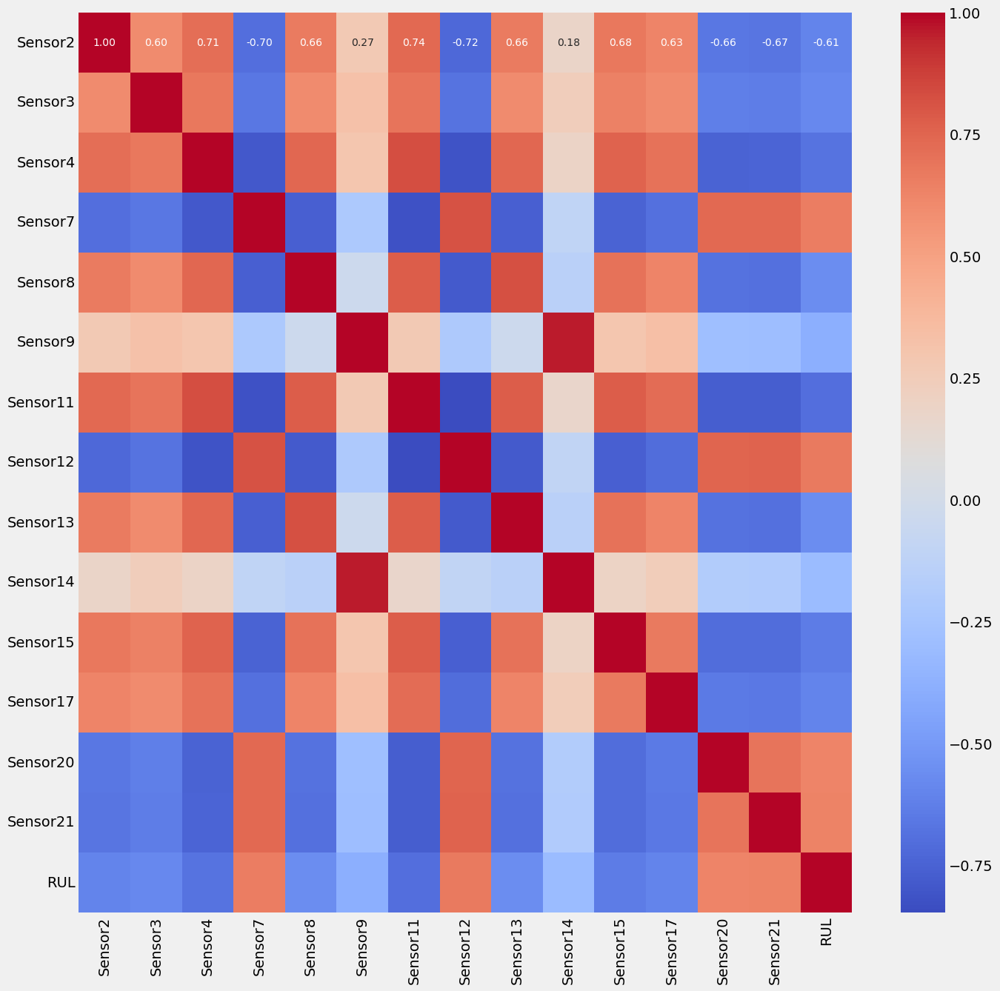

In [44]:
# necessary features for analysis
not_required_feats = ["Sensor1", "Sensor5", "Sensor6", "Sensor10", 
                      "Sensor16", "Sensor18", "Sensor19"]

feats = [feat for feat in sensor_col_names if feat not in not_required_feats]

corr = df_train[feats + ["RUL"]].corr()

# Get the minimum and maximum values in the correlation matrix
min_val = np.min(corr.values)
max_val = np.max(corr.values)

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111)
ax = sns.heatmap(corr, annot=True, cmap = "coolwarm", fmt='.2f', annot_kws={"size": 10}, ax=ax)
plt.show()

In [45]:
corr

,Sensor2,Sensor3,Sensor4,Sensor7,Sensor8,Sensor9,Sensor11,Sensor12,Sensor13,Sensor14,Sensor15,Sensor17,Sensor20,Sensor21,RUL
Sensor2,1.000000,0.602610,0.714949,-0.702136,0.662325,0.273764,0.740020,-0.724578,0.661792,0.179752,0.675975,0.629886,-0.661841,-0.668050,-0.606484
Sensor3,0.602610,1.000000,0.678413,-0.664595,0.602481,0.322964,0.695900,-0.680307,0.600963,0.237137,0.639921,0.600017,-0.625941,-0.633901,-0.584520
Sensor4,0.714949,0.678413,1.000000,-0.793130,0.746852,0.297429,0.830136,-0.815591,0.745158,0.190748,0.758459,0.703499,-0.748067,-0.745193,-0.678948
Sensor7,-0.702136,-0.664595,-0.793130,1.000000,-0.767132,-0.217835,-0.822805,0.812713,-0.764611,-0.110053,-0.747051,-0.692893,0.736163,0.737447,0.657223
Sensor8,0.662325,0.602481,0.746852,-0.767132,1.000000,-0.032091,0.782213,-0.786540,0.826084,-0.144787,0.700949,0.627785,-0.687030,-0.688840,-0.563968
Sensor9,0.273764,0.322964,0.297429,-0.217835,-0.032091,1.000000,0.274591,-0.210238,-0.034763,0.963157,0.293753,0.337110,-0.285280,-0.292795,-0.390102
Sensor11,0.740020,0.695900,0.830136,-0.822805,0.782213,0.274591,1.000000,-0.846884,0.780761,0.163408,0.780913,0.722296,-0.771510,-0.772554,-0.696228
Sensor12,-0.724578,-0.680307,-0.815591,0.812713,-0.786540,-0.210238,-0.846884,1.000000,-0.788441,-0.098141,-0.766052,-0.703485,0.751943,0.756263,0.671983
Sensor13,0.661792,0.600963,0.745158,-0.764611,0.826084,-0.034763,0.780761,-0.788441,1.000000,-0.147036,0.697662,0.627410,-0.686172,-0.688948,-0.562569
Sensor14,0.179752,0.237137,0.190748,-0.110053,-0.144787,0.963157,0.163408,-0.098141,-0.147036,1.000000,0.193761,0.246621,-0.187364,-0.192415,-0.306769


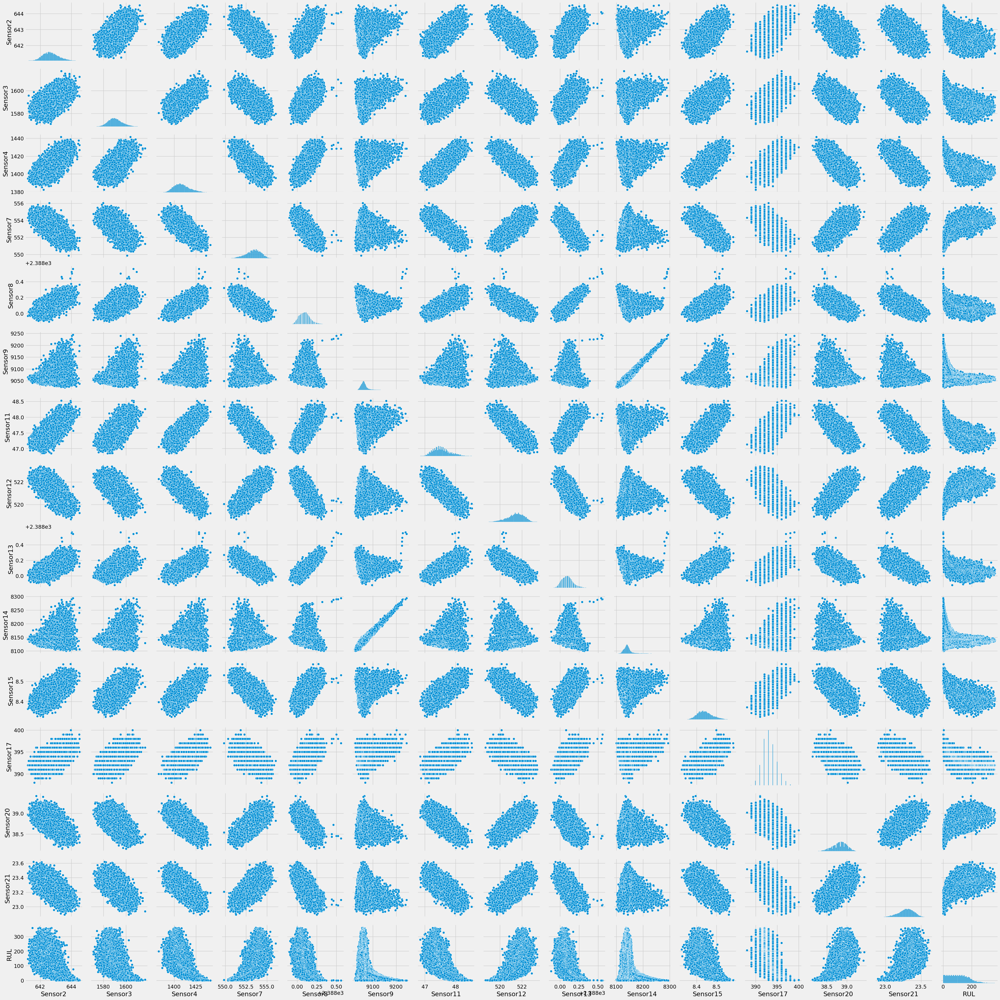

In [46]:
import warnings

# Suppress all warnings
warnings.simplefilter(action='ignore')

selected_columns = feats + ['RUL']
pairplot_data = df_train[selected_columns]  # Assuming df_train is your DataFrame

# Plot pairplot
sns.pairplot(pairplot_data)
plt.show()

Sensor 14 and 9 have high correlation

<Axes: xlabel='Sensor14', ylabel='Sensor9'>

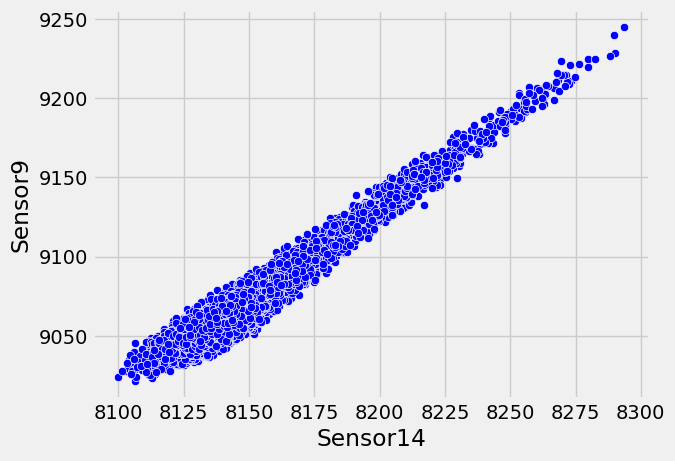

In [47]:
sns.scatterplot(x=df_train.Sensor14, y=df_train.Sensor9, c='b')

From sensor 14 and 9, sensor 9 have higher correlation with RUL than 14, so we drop sensor14.

In [48]:
feats = [i for i in feats if "Sensor14" not in i]
feats

['Sensor2',
 'Sensor3',
 'Sensor4',
 'Sensor7',
 'Sensor8',
 'Sensor9',
 'Sensor11',
 'Sensor12',
 'Sensor13',
 'Sensor15',
 'Sensor17',
 'Sensor20',
 'Sensor21']

### Sensor Measurement before failure

In [49]:
# Filter the DataFrame
filtered_df = df_train[(df_train['UnitNumber'] <= 10) & (df_train['RUL'] <= 50)]

# Group by 'UnitNumber' and reset the index for each group
grouped_df = (filtered_df.groupby('UnitNumber')
                          .apply(lambda x: x.reset_index(drop=True))
                          .reset_index(drop=True))

# Display the resulting DataFrame
grouped_df

,UnitNumber,Cycle,Optset1,Optset2,Optset3,Sensor1,Sensor2,Sensor3,Sensor4,Sensor5,...,Sensor13,Sensor14,Sensor15,Sensor16,Sensor17,Sensor18,Sensor19,Sensor20,Sensor21,RUL
0,1,142,0.0026,0.0002,100.0,518.67,642.51,1595.29,1413.42,14.62,...,2388.18,8124.87,8.4291,0.03,392,2388,100.0,38.71,23.2816,50
1,1,143,-0.0005,-0.0003,100.0,518.67,642.77,1593.10,1404.21,14.62,...,2388.11,8126.81,8.4419,0.03,393,2388,100.0,38.79,23.2305,49
2,1,144,0.0025,-0.0004,100.0,518.67,643.09,1591.89,1405.76,14.62,...,2388.17,8125.47,8.4601,0.03,393,2388,100.0,38.75,23.2249,48
3,1,145,-0.0004,-0.0001,100.0,518.67,642.95,1594.92,1409.63,14.62,...,2388.15,8130.91,8.4644,0.03,395,2388,100.0,38.67,23.1490,47
4,1,146,0.0002,-0.0003,100.0,518.67,642.72,1586.75,1408.82,14.62,...,2388.12,8129.19,8.4312,0.03,392,2388,100.0,38.69,23.3233,46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
505,10,218,-0.0029,0.0004,100.0,518.67,643.70,1598.64,1426.21,14.62,...,2388.22,8173.14,8.4954,0.03,395,2388,100.0,38.47,23.1209,4
506,10,219,-0.0018,0.0004,100.0,518.67,643.46,1603.54,1424.54,14.62,...,2388.23,8177.31,8.5230,0.03,396,2388,100.0,38.48,23.2340,3
507,10,220,-0.0013,0.0002,100.0,518.67,643.46,1604.91,1422.76,14.62,...,2388.25,8181.11,8.5182,0.03,396,2388,100.0,38.53,23.2187,2
508,10,221,0.0005,-0.0001,100.0,518.67,644.09,1604.40,1432.13,14.62,...,2388.19,8183.38,8.5312,0.03,395,2388,100.0,38.22,23.1596,1


In [52]:
grouped_df.head()

,UnitNumber,Cycle,Optset1,Optset2,Optset3,Sensor1,Sensor2,Sensor3,Sensor4,Sensor5,...,Sensor13,Sensor14,Sensor15,Sensor16,Sensor17,Sensor18,Sensor19,Sensor20,Sensor21,RUL
0,1,142,0.0026,0.0002,100.0,518.67,642.51,1595.29,1413.42,14.62,...,2388.18,8124.87,8.4291,0.03,392,2388,100.0,38.71,23.2816,50
1,1,143,-0.0005,-0.0003,100.0,518.67,642.77,1593.10,1404.21,14.62,...,2388.11,8126.81,8.4419,0.03,393,2388,100.0,38.79,23.2305,49
2,1,144,0.0025,-0.0004,100.0,518.67,643.09,1591.89,1405.76,14.62,...,2388.17,8125.47,8.4601,0.03,393,2388,100.0,38.75,23.2249,48
3,1,145,-0.0004,-0.0001,100.0,518.67,642.95,1594.92,1409.63,14.62,...,2388.15,8130.91,8.4644,0.03,395,2388,100.0,38.67,23.1490,47
4,1,146,0.0002,-0.0003,100.0,518.67,642.72,1586.75,1408.82,14.62,...,2388.12,8129.19,8.4312,0.03,392,2388,100.0,38.69,23.3233,46


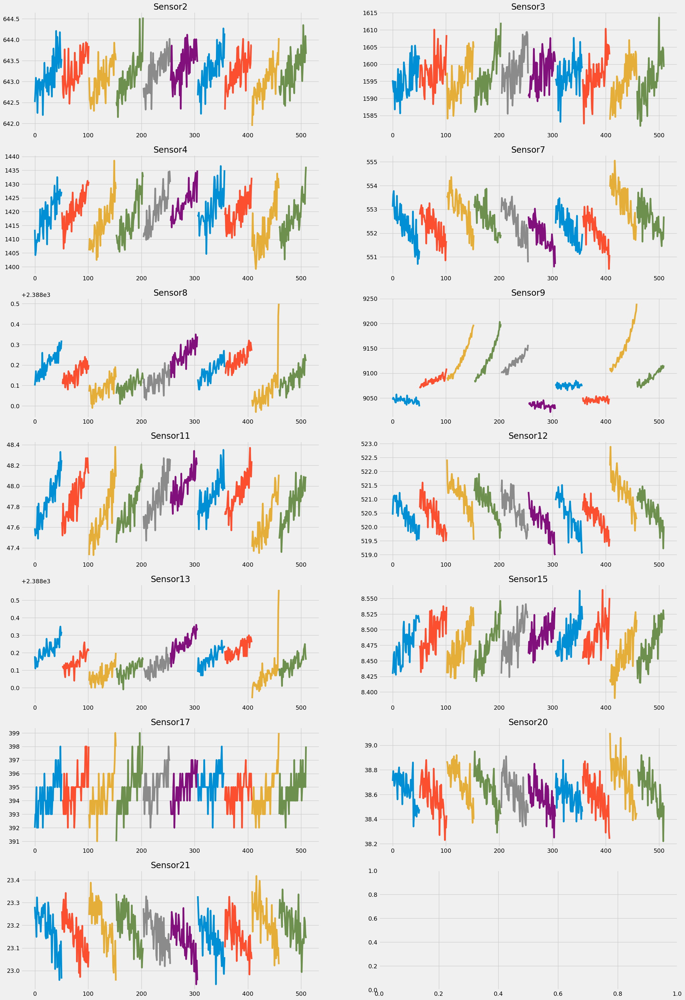

In [54]:
fig, ax = plt.subplots(figsize = (25,40), ncols = 2, nrows = 7)

ax = ax.ravel()
for i, feat in enumerate(feats):
    grouped_df.groupby('UnitNumber')[feat].plot(kind = "line", ax = ax[i])
    ax[i].set_title(feat)